In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt

from sklearn.model_selection import train_test_split

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from xgboost import XGBClassifier

from sklearn.metrics import accuracy_score, classification_report

In [2]:
#pip install lime

In [3]:
file = "D:/Study material/sem8/data/heart_data.csv"
data = pd.read_csv(file)
print("Heart Data")
data.head(10)

Heart Data


,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,M,ATA,140,289,0,Normal,172,N,0.0,Up,0
1,49,F,NAP,160,180,0,Normal,156,N,1.0,Flat,1
2,37,M,ATA,130,283,0,ST,98,N,0.0,Up,0
3,48,F,ASY,138,214,0,Normal,108,Y,1.5,Flat,1
4,54,M,NAP,150,195,0,Normal,122,N,0.0,Up,0
5,39,M,NAP,120,339,0,Normal,170,N,0.0,Up,0
6,45,F,ATA,130,237,0,Normal,170,N,0.0,Up,0
7,54,M,ATA,110,208,0,Normal,142,N,0.0,Up,0
8,37,M,ASY,140,207,0,Normal,130,Y,1.5,Flat,1
9,48,F,ATA,120,284,0,Normal,120,N,0.0,Up,0


In [4]:
data.shape

(918, 12)

Age: age of the patient [years]

Sex: sex of the patient [M: Male, F: Female]

ChestPainType: chest pain type [TA: Typical Angina, ATA: Atypical Angina, NAP: Non-Anginal Pain, ASY: Asymptomatic]

RestingBP: resting blood pressure [mm Hg]

Cholesterol: serum cholesterol [mm/dl]

FastingBS: fasting blood sugar [1: if FastingBS > 120 mg/dl, 0: otherwise]

RestingECG: resting electrocardiogram results [Normal: Normal, ST: having ST-T wave abnormality (T wave inversions and/or ST elevation or depression of > 0.05 mV), LVH: showing probable or definite left ventricular hypertrophy by Estes' criteria]

MaxHR: maximum heart rate achieved [Numeric value between 60 and 202]

ExerciseAngina: exercise-induced angina [Y: Yes, N: No]

Oldpeak: oldpeak = ST [Numeric value measured in depression]

ST_Slope: the slope of the peak exercise ST segment [Up: upsloping, Flat: flat, Down: downsloping]

HeartDisease: output class [1: heart disease, 0: Normal]

In [5]:
data.isnull().sum()

Age               0
Sex               0
ChestPainType     0
RestingBP         0
Cholesterol       0
FastingBS         0
RestingECG        0
MaxHR             0
ExerciseAngina    0
Oldpeak           0
ST_Slope          0
HeartDisease      0
dtype: int64

In [6]:
data.drop_duplicates(keep='first',inplace=True)
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 918 entries, 0 to 917
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Age             918 non-null    int64  
 1   Sex             918 non-null    object 
 2   ChestPainType   918 non-null    object 
 3   RestingBP       918 non-null    int64  
 4   Cholesterol     918 non-null    int64  
 5   FastingBS       918 non-null    int64  
 6   RestingECG      918 non-null    object 
 7   MaxHR           918 non-null    int64  
 8   ExerciseAngina  918 non-null    object 
 9   Oldpeak         918 non-null    float64
 10  ST_Slope        918 non-null    object 
 11  HeartDisease    918 non-null    int64  
dtypes: float64(1), int64(6), object(5)
memory usage: 93.2+ KB


In [7]:
data["Sex"] = data["Sex"].replace(["M","F"],[0,1])

In [8]:
data["ChestPainType"] = data["ChestPainType"].replace(["ASY","NAP","ATA","TA"],[0,1,2,3])

In [9]:
data["RestingECG"] = data["RestingECG"].replace(["Normal","LVH","ST"],[0,1,2])

In [10]:
data["ExerciseAngina"] = data["ExerciseAngina"].replace(["N","Y"],[0,1])

In [11]:
data["ST_Slope"] = data["ST_Slope"].replace(["Flat","Up","Down"],[0,1,2])

In [12]:
data.head()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,0,2,140,289,0,0,172,0,0.0,1,0
1,49,1,1,160,180,0,0,156,0,1.0,0,1
2,37,0,2,130,283,0,2,98,0,0.0,1,0
3,48,1,0,138,214,0,0,108,1,1.5,0,1
4,54,0,1,150,195,0,0,122,0,0.0,1,0


In [13]:
y = data["HeartDisease"]
x = data.drop(["HeartDisease"],axis=1)

In [14]:
y.head()

0    0
1    1
2    0
3    1
4    0
Name: HeartDisease, dtype: int64

In [15]:
x.head()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope
0,40,0,2,140,289,0,0,172,0,0.0,1
1,49,1,1,160,180,0,0,156,0,1.0,0
2,37,0,2,130,283,0,2,98,0,0.0,1
3,48,1,0,138,214,0,0,108,1,1.5,0
4,54,0,1,150,195,0,0,122,0,0.0,1


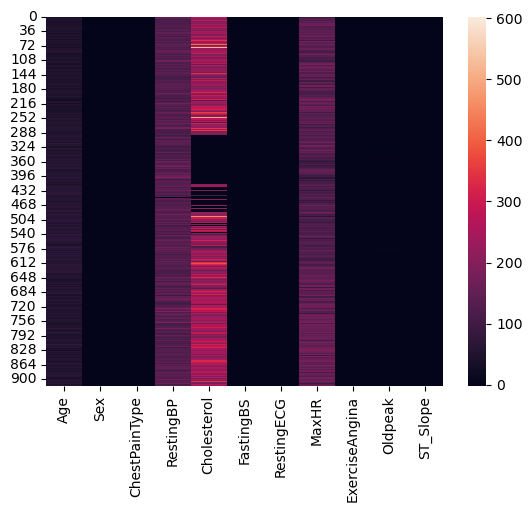

In [16]:
import seaborn as sn 
hm = sn.heatmap(data = x) 
  
# displaying the plotted heatmap 
plt.show()

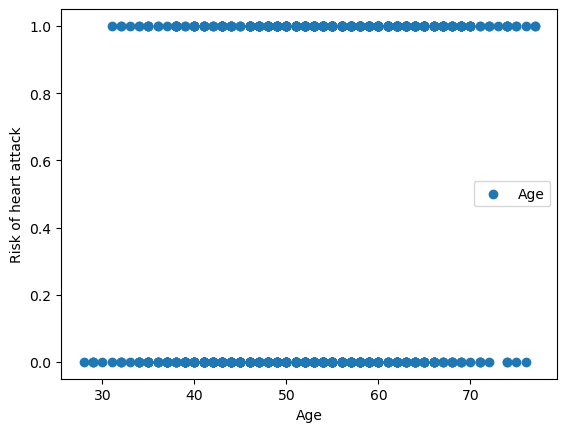

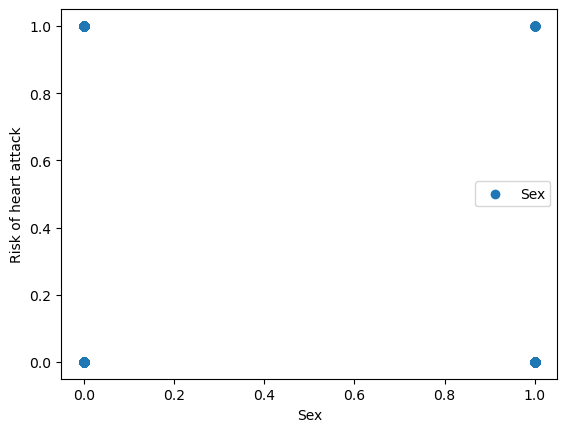

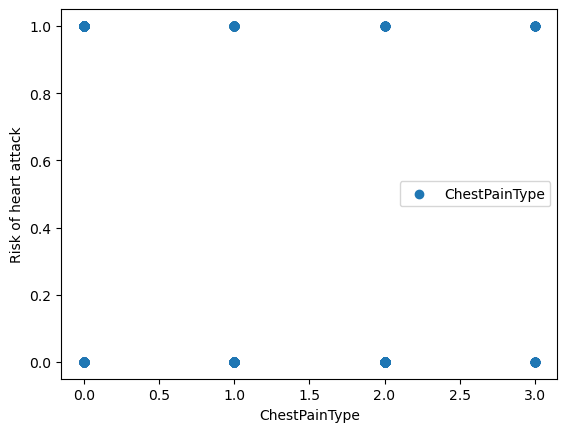

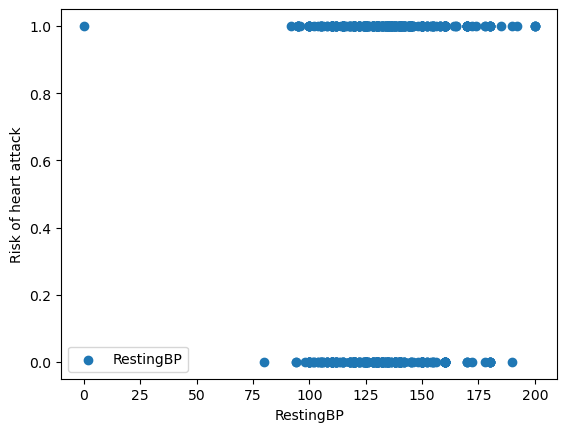

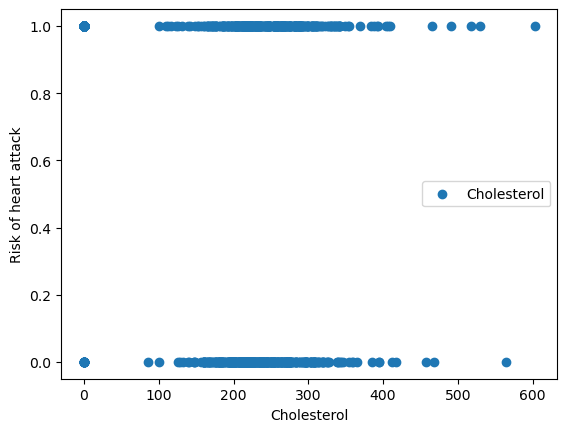

...

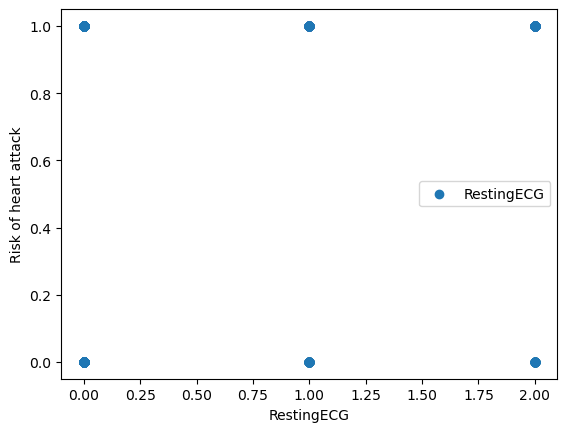

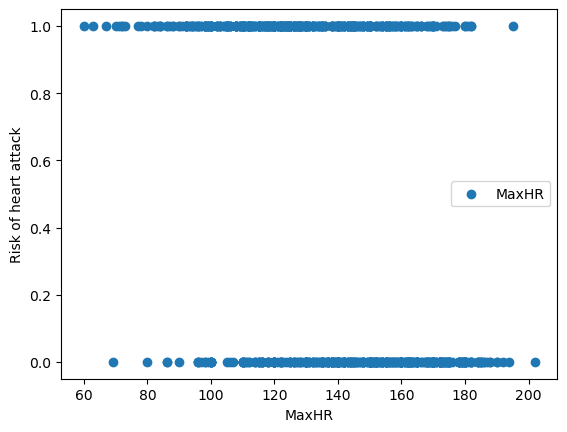

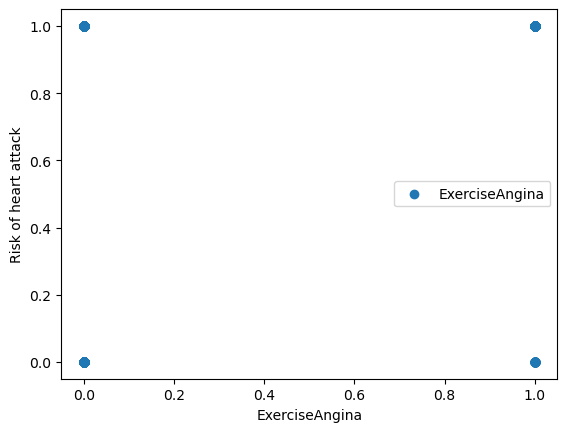

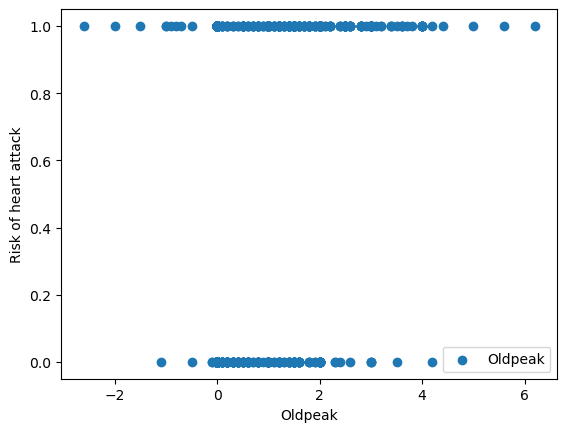

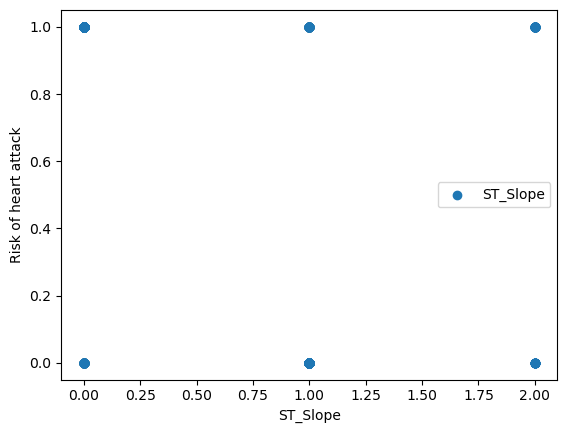

In [17]:
for i in x:
    plt.scatter(x[i],y, label=i)
    plt.legend()
    plt.xlabel(i)
    plt.ylabel("Risk of heart attack")
    plt.show()

In [18]:
mx = np.max(x)
mn = np.min(x)
x = (x - np.min(x))/(np.max(x)-np.min(x))

C:\Users\Siva\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
C:\Users\Siva\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:84: FutureWarning: In a future version, DataFrame.min(axis=None) will return a scalar min over the entire DataFrame. To retain the old behavior, use 'frame.min(axis=0)' or just 'frame.min()'
  return reduction(axis=axis, out=out, **passkwargs)


In [19]:
print(mx)

Age                77.0
Sex                 1.0
ChestPainType       3.0
RestingBP         200.0
Cholesterol       603.0
FastingBS           1.0
RestingECG          2.0
MaxHR             202.0
ExerciseAngina      1.0
Oldpeak             6.2
ST_Slope            2.0
dtype: float64


In [20]:
print(mn)

Age               28.0
Sex                0.0
ChestPainType      0.0
RestingBP          0.0
Cholesterol        0.0
FastingBS          0.0
RestingECG         0.0
MaxHR             60.0
ExerciseAngina     0.0
Oldpeak           -2.6
ST_Slope           0.0
dtype: float64


In [21]:
x.head()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope
0,0.244898,0.0,0.666667,0.70,0.479270,0.0,0.0,0.788732,0.0,0.295455,0.5
1,0.428571,1.0,0.333333,0.80,0.298507,0.0,0.0,0.676056,0.0,0.409091,0.0
2,0.183673,0.0,0.666667,0.65,0.469320,0.0,1.0,0.267606,0.0,0.295455,0.5
3,0.408163,1.0,0.000000,0.69,0.354892,0.0,0.0,0.338028,1.0,0.465909,0.0
4,0.530612,0.0,0.333333,0.75,0.323383,0.0,0.0,0.436620,0.0,0.295455,0.5


In [22]:
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.2)

In [23]:
print(x_train['Age'].size,y_train.size)
print(x_test['Age'].size,y_test.size)

734 734
184 184


In [24]:
#####Logistic Regression

In [25]:
mod1 = LogisticRegression()
mod1.fit(x_train, y_train)
# Prediction
y_pred = mod1.predict(x_test)
 
acc_lr = accuracy_score(y_test, y_pred)
print("Logistic Regression model", acc_lr)
result = classification_report(y_test, y_pred)
print("Classifiction Report")
print(result)

Logistic Regression model 0.8586956521739131
Classifiction Report
              precision    recall  f1-score   support

           0       0.85      0.81      0.83        79
           1       0.86      0.90      0.88       105

    accuracy                           0.86       184
   macro avg       0.86      0.85      0.85       184
weighted avg       0.86      0.86      0.86       184



In [26]:
######Decision Tree

In [38]:
tree1 = DecisionTreeClassifier(criterion="gini",random_state=100, max_depth=15, min_samples_leaf=10)
tree1.fit(x_train,y_train)
#Prediction
y_pred = tree1.predict(x_test)
acc_tree = accuracy_score(y_test,y_pred)
print("Decision Tree model", acc_tree)
result = classification_report(y_test, y_pred)
print("Classifiction Report")
print(result)

Decision Tree model 0.8532608695652174
Classifiction Report
              precision    recall  f1-score   support

           0       0.86      0.78      0.82        79
           1       0.85      0.90      0.88       105

    accuracy                           0.85       184
   macro avg       0.85      0.84      0.85       184
weighted avg       0.85      0.85      0.85       184



In [26]:
##########KNN

In [39]:
knn = KNeighborsClassifier(n_neighbors=5, leaf_size=50)
knn.fit(x_train,y_train)
#Predictin
y_pred = knn.predict(x_test)
acc_knn = accuracy_score(y_test,y_pred)
print("KNN model",acc_knn)
result = classification_report(y_test, y_pred)
print("Classifiction Report")
print(result)

KNN model 0.8641304347826086
Classifiction Report
              precision    recall  f1-score   support

           0       0.85      0.84      0.84        79
           1       0.88      0.89      0.88       105

    accuracy                           0.86       184
   macro avg       0.86      0.86      0.86       184
weighted avg       0.86      0.86      0.86       184



In [40]:
###########Random Forest

In [41]:
param_grid = { 
    'n_estimators': [200,1000],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [5,20],
    'criterion' :['gini', 'entropy']
}
rfc=RandomForestClassifier(random_state=42)

In [42]:
CV_rfc = GridSearchCV(estimator=rfc, param_grid=param_grid, cv= 5)
CV_rfc.fit(x_train, y_train)

C:\Users\Siva\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
C:\Users\Siva\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
C:\Users\Siva\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for Ran

C:\Users\Siva\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
C:\Users\Siva\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
C:\Users\Siva\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for Ran

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42),
             param_grid={'criterion': ['gini', 'entropy'], 'max_depth': [5, 20],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [200, 1000]})

In [43]:
CV_rfc.best_params_

{'criterion': 'entropy',
 'max_depth': 20,
 'max_features': 'auto',
 'n_estimators': 1000}

In [44]:
rcf1 = RandomForestClassifier(random_state=42,criterion='entropy',max_depth=20, max_features='auto', n_estimators=1000)
rcf1.fit(x_train,y_train)
y_pred = rcf1.predict(x_test)
acc_rf = accuracy_score(y_test,y_pred)
print("Random Forest",acc_rf)
result = classification_report(y_test, y_pred)
print("Classifiction Report")
print(result)

C:\Users\Siva\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


Random Forest 0.8967391304347826
Classifiction Report
              precision    recall  f1-score   support

           0       0.97      0.78      0.87        79
           1       0.86      0.98      0.92       105

    accuracy                           0.90       184
   macro avg       0.91      0.88      0.89       184
weighted avg       0.91      0.90      0.89       184



In [ ]:
xgb = XGBClassifier(random_state=42, n_estimators=1000)
xgb.fit(x_train,y_train)
y_pred = xgb.predict(x_test)
acc_xg = accuracy_score(y_test,y_pred)
print("XGBoost",acc_xg)
result = classification_report(y_test, y_pred)
print("Classifiction Report")
print(result)

# EXPLAINABLE MODEL

Using lime library

In [48]:
from lime import lime_tabular

In [49]:
explainer = lime_tabular.LimeTabularExplainer(training_data = np.array(x_train), 
                                               mode = "regression", feature_names = x_train.columns)


In [56]:
explain = explainer.explain_instance(data_row = x_test.iloc[3], predict_fn = rcf1.predict)
explain.show_in_notebook(show_table = True)

C:\Users\Siva\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


In [57]:
lst = explain.as_list()
lst.sort()
print(lst)

[('0.00 < ExerciseAngina <= 1.00', 0.11125910744032726), ('0.35 < Oldpeak <= 0.47', 0.014675509121827688), ('0.53 < Age <= 0.65', 0.03320342144653381), ('ChestPainType <= 0.00', 0.2559204049966225), ('Cholesterol <= 0.29', 0.11831749048038387), ('FastingBS <= 0.00', -0.07045142532647945), ('MaxHR <= 0.42', 0.0405011273258569), ('RestingECG <= 0.00', -0.023182425811613592), ('ST_Slope <= 0.00', 0.5481737054415041), ('Sex <= 0.00', 0.17212373174396964)]


In [58]:
def explain_function(pred,lst):
    if(pred):
        print('You are in risk of a heart attack')
    else:
        print('You are not in risk of a heart attack')
    print('')
    print('################## REASON ################')
    print('')
    for ind in lst:
        var_name = ''
        num = ''
        temp_lst = []
        for j in ind[0]:
            if((j>='a' and j<='z') or (j>='A' and j<='Z') or j=='_'):
                var_name = var_name + j
            if((j>='0' and j<='9') or j=='.'):
                num = num + j
            elif(num):
                temp_lst.append(float(num))
                num = ''
        if(num):
            temp_lst.append(float(num))
        
        conclu = ''
        if(ind[1]>0.0):
            conclu =  'This factor increases the risk of a heart attack'
        else:
            conclu = 'This factor reduces the risk of a heart attack'       
        
        if(len(temp_lst)==1):
            non_normal_val = mx[var_name]*temp_lst[0] + mn[var_name]
            if('<' in ind[0]):
                print('Entered',var_name,'is less than',non_normal_val)
            elif('>' in ind[0]):
                print('Entered',var_name,'is greater than',non_normal_val)
            else:
                print('Entered',var_name,'is equal to',non_normal_val)
        else:
            print('Entered', var_name,'int between',mx[var_name]*temp_lst[0] + mn[var_name],'and',mx[var_name]*temp_lst[1] + mn[var_name])
        print(conclu)
        print('')
    

In [59]:
explain_function(1,lst)

You are in risk of a heart attack

################## REASON ################

Entered ExerciseAngina int between 0.0 and 1.0
This factor increases the risk of a heart attack

Entered Oldpeak int between -0.43000000000000016 and 0.3139999999999996
This factor increases the risk of a heart attack

Entered Age int between 68.81 and 78.05000000000001
This factor increases the risk of a heart attack

Entered ChestPainType is less than 0.0
This factor increases the risk of a heart attack

Entered Cholesterol is less than 174.86999999999998
This factor increases the risk of a heart attack

Entered FastingBS is less than 0.0
This factor reduces the risk of a heart attack

Entered MaxHR is less than 144.84
This factor increases the risk of a heart attack

Entered RestingECG is less than 0.0
This factor reduces the risk of a heart attack

Entered ST_Slope is less than 0.0
This factor increases the risk of a heart attack

Entered Sex is less than 0.0
This factor increases the risk of a heart att

# Results of different models with XAI

### Using LIME

#### Logistic Regression

In [93]:
explain = explainer.explain_instance(data_row = x_test.iloc[0], predict_fn = mod1.predict)
explain.show_in_notebook(show_table = True)

X does not have valid feature names, but LogisticRegression was fitted with feature names


#### KNN

In [94]:
explain = explainer.explain_instance(data_row = x_test.iloc[0], predict_fn = knn.predict)
explain.show_in_notebook(show_table = True)

X does not have valid feature names, but KNeighborsClassifier was fitted with feature names


#### Random Forest Classifier

In [95]:
explain = explainer.explain_instance(data_row = x_test.iloc[0], predict_fn = rcf1.predict)
explain.show_in_notebook(show_table = True)

X does not have valid feature names, but RandomForestClassifier was fitted with feature names


#### Decision Tree

In [96]:
explain = explainer.explain_instance(data_row = x_test.iloc[0], predict_fn = tree1.predict)
explain.show_in_notebook(show_table = True)

X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names


#### XGBoost Classifier

In [97]:
explain = explainer.explain_instance(data_row = x_test.iloc[0], predict_fn = xgb.predict)
explain.show_in_notebook(show_table = True)

### Using SHAP

In [98]:
#pip install shap

In [99]:
import shap

#### Logistic Regression

In [100]:
shap_explainer = shap.Explainer(mod1.predict, x_test)
shap_values = shap_explainer(x_test)

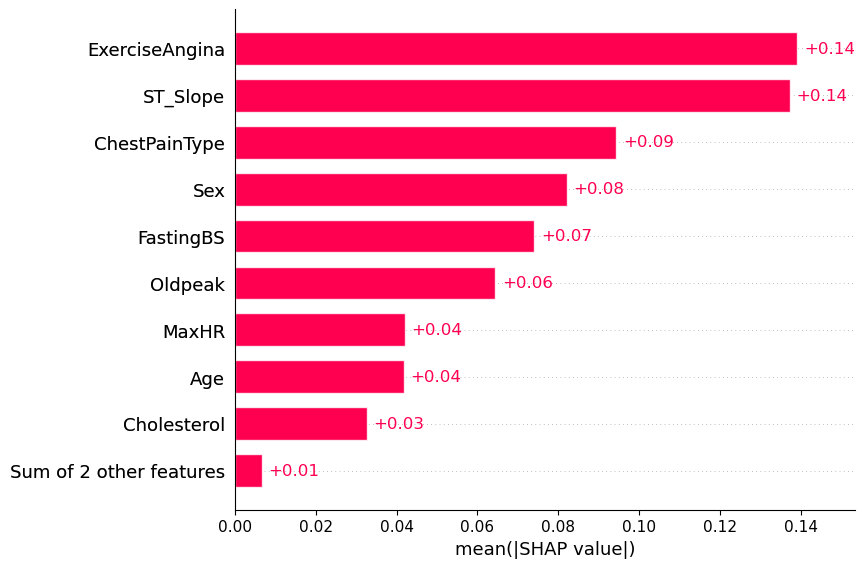

In [101]:
shap.plots.bar(shap_values)

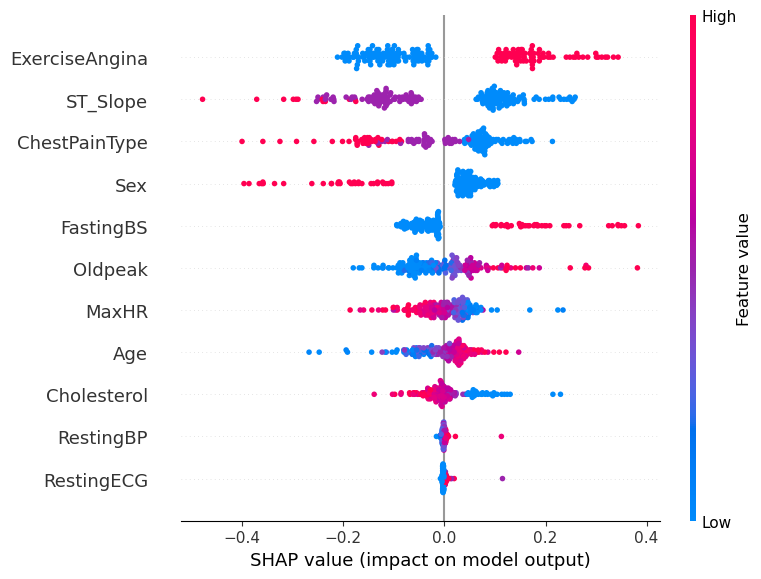

In [102]:
shap.summary_plot(shap_values)

#### KNN

PermutationExplainer explainer: 185it [05:04,  1.72s/it]                                                               


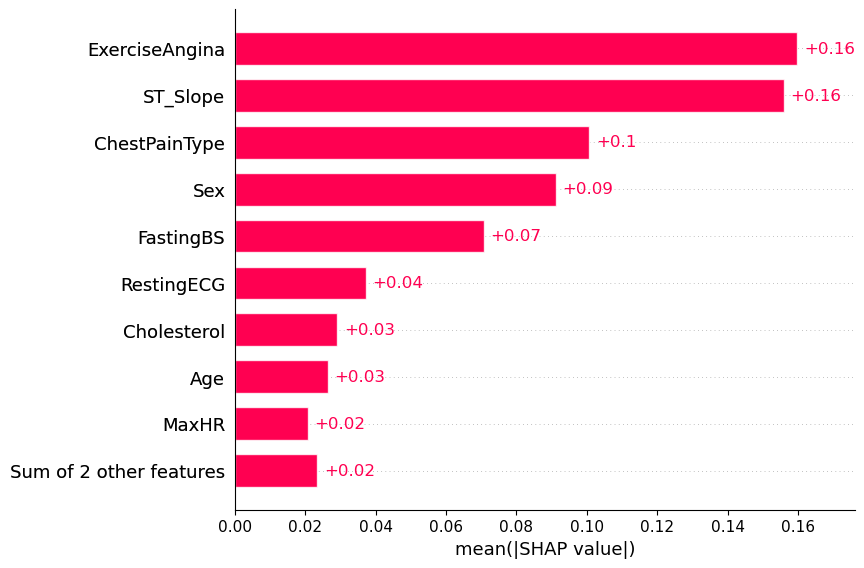

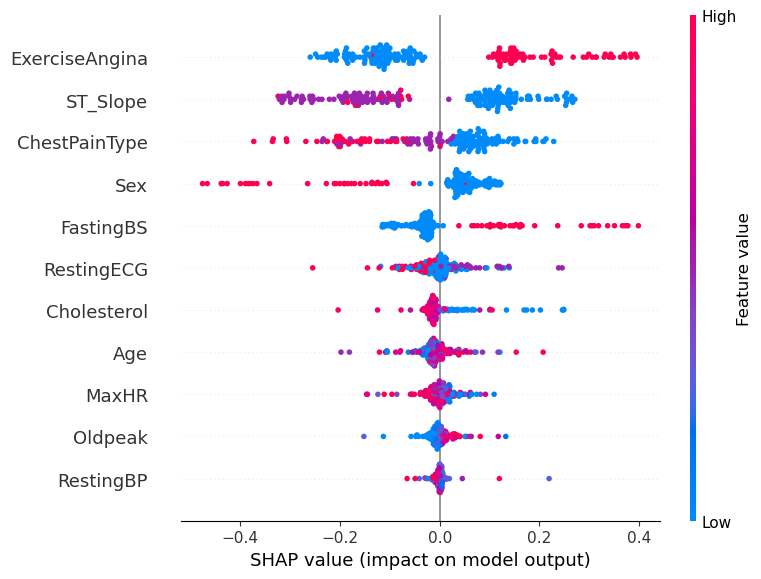

In [103]:
shap_explainer = shap.Explainer(knn.predict, x_test)
shap_values = shap_explainer(x_test)
shap.plots.bar(shap_values)
shap.summary_plot(shap_values)

#### Random Forest Classifier

PermutationExplainer explainer: 185it [12:42,  4.19s/it]                                                               


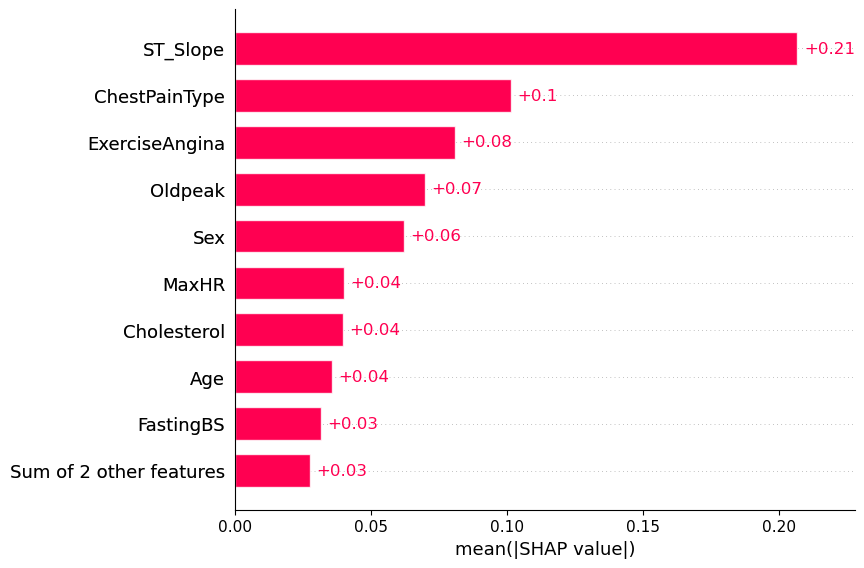

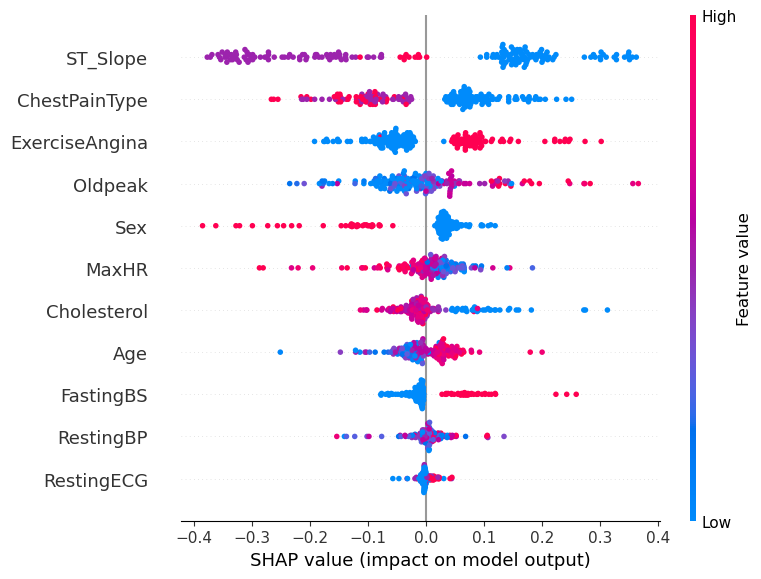

In [104]:
shap_explainer = shap.Explainer(rcf1.predict, x_test)
shap_values = shap_explainer(x_test)
shap.plots.bar(shap_values)
shap.summary_plot(shap_values)

#### Decision Tree

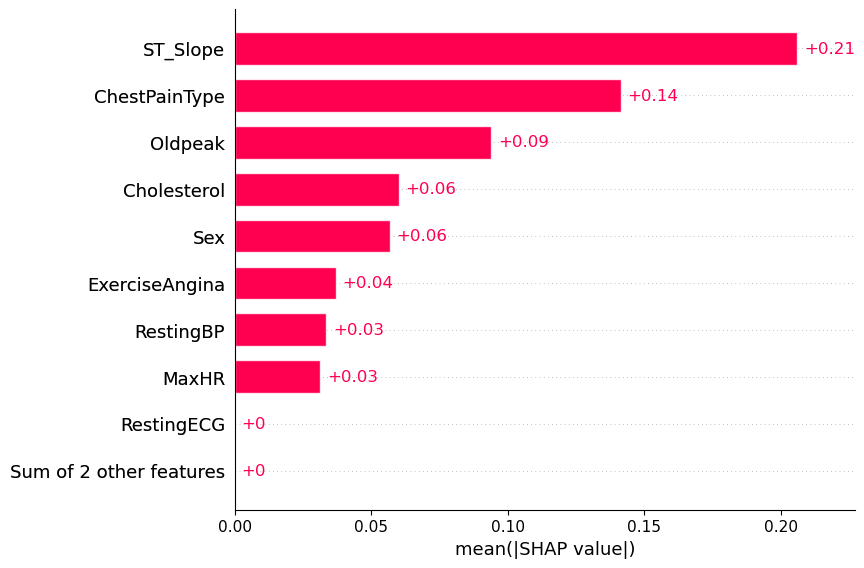

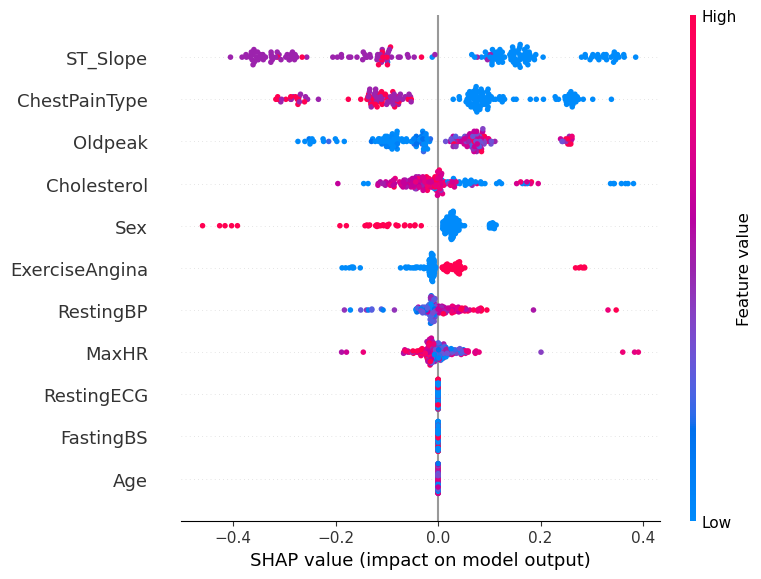

In [105]:
shap_explainer = shap.Explainer(tree1.predict, x_test)
shap_values = shap_explainer(x_test)
shap.plots.bar(shap_values)
shap.summary_plot(shap_values)

#### XGBoost Classifier

PermutationExplainer explainer: 185it [00:43,  3.16it/s]                                                               


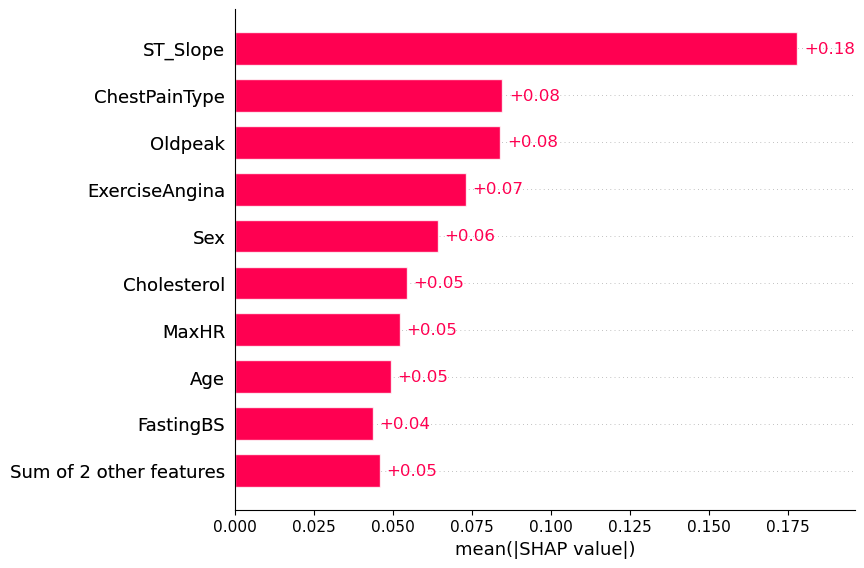

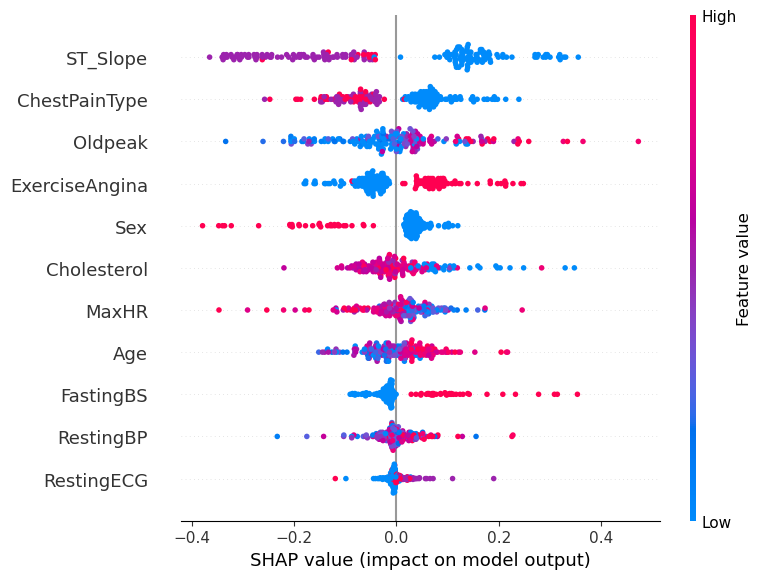

In [106]:
shap_explainer = shap.Explainer(xgb.predict, x_test)
shap_values = shap_explainer(x_test)
shap.plots.bar(shap_values)
shap.summary_plot(shap_values)

In [107]:
print(shap_values[0])

.values =
array([ 0.035     ,  0.02071429,  0.09571429,  0.03309524,  0.06      ,
        0.10547619, -0.00071429, -0.005     , -0.02809524, -0.00833333,
        0.14214286])

.base_values =
0.55

.data =
array([0.67346939, 0.        , 0.        , 0.8       , 0.        ,
       1.        , 1.        , 0.59859155, 0.        , 0.40909091,
       0.        ])


In [108]:
import seaborn

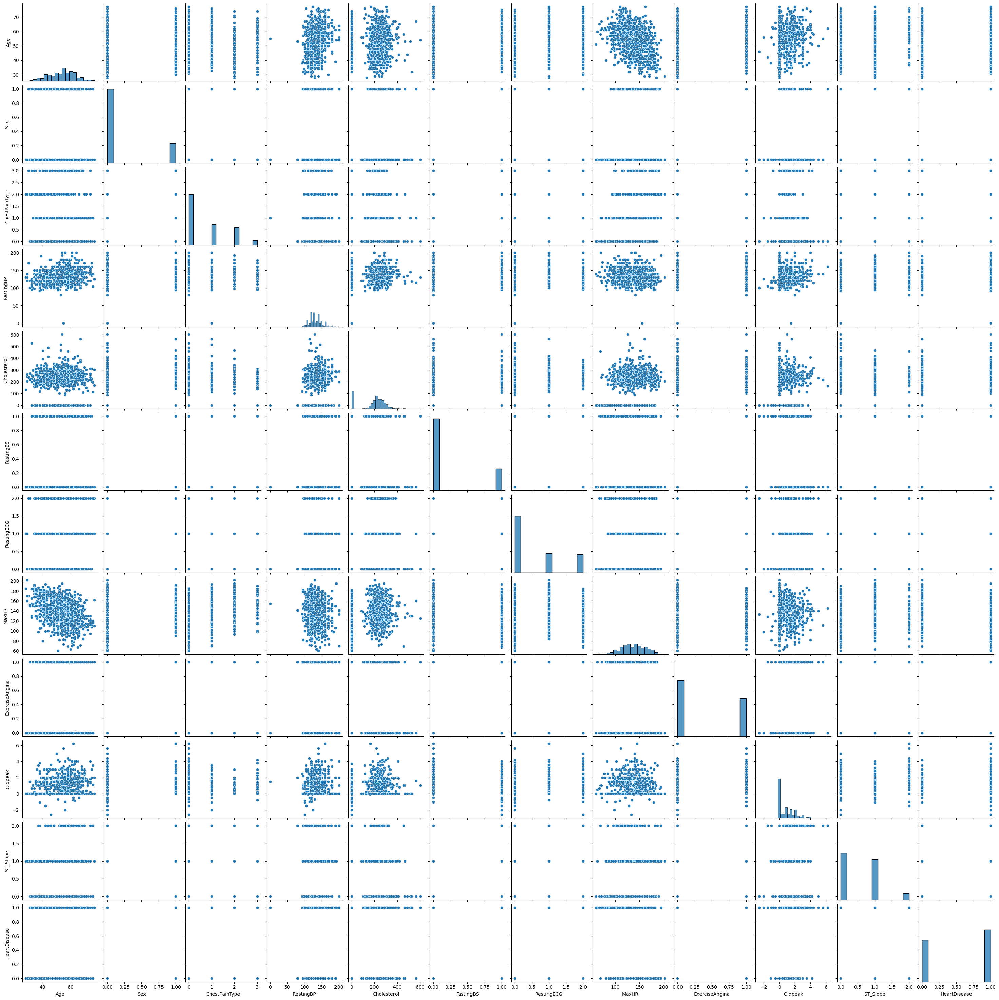

In [136]:
seaborn.pairplot(data)
# to show
plt.show()